In [1]:
import pandas as pd
import tweepy
import re
from tweepy import OAuthHandler
from tweepy import API
from textblob import TextBlob
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl', offline=True)
import matplotlib.pyplot as plt
%matplotlib inline

### Importing Twitter API Credentials

In [2]:
ACCESS_TOKEN = "1230795764017827840-9kjfKUXqldTRh5Q7my1Zw0pRH1fUkG"
ACCESS_TOKEN_SECRET = "QGTrqGaeZpDAQKac38wN1zjp4QdJvF04ASY3Sgo49dgg5"
CONSUMER_KEY = "BK8LaqjdMrfowxJYhVf4kMCFs"
CONSUMER_SECRET = "6c4eDwoeP557DshT0YwhyuohRQYPrmI6DStInEkQ1EA0JKrdb3"

In [3]:
authenticate = tweepy.OAuthHandler(CONSUMER_KEY, CONSUMER_SECRET)
authenticate.set_access_token(ACCESS_TOKEN, ACCESS_TOKEN_SECRET)

In [4]:
api = tweepy.API(authenticate, wait_on_rate_limit = True)

In [5]:
tweets_covid = []
#Get the first 500 items based on the search query and store it
for tweet in tweepy.Cursor(api.search, q='#Lockdown', lang = 'en', tweet_mode = 'extended').items(500):
    tweets_covid.append(tweet)

In [6]:
tweets_covid

[Status(_api=<tweepy.api.API object at 0x000002AB32026FD0>, _json={'created_at': 'Mon Oct 25 14:15:50 +0000 2021', 'id': 1452640044980789258, 'id_str': '1452640044980789258', 'full_text': 'RT @hugotalks1: JAB PASSPORT Shares Personal Data With AMAZON and MICROSOFT / Hugo Talks #lockdown\nhttps://t.co/HC5VLqDa0A', 'truncated': False, 'display_text_range': [0, 122], 'entities': {'hashtags': [{'text': 'lockdown', 'indices': [89, 98]}], 'symbols': [], 'user_mentions': [{'screen_name': 'hugotalks1', 'name': 'hugotalks', 'id': 1312387913393545217, 'id_str': '1312387913393545217', 'indices': [3, 14]}], 'urls': [{'url': 'https://t.co/HC5VLqDa0A', 'expanded_url': 'https://hugotalks.com/2021/10/25/jab-passport-shares-personal-data-with-amazon-and-microsoft-hugo-talks-lockdowns-lockdown/', 'display_url': 'hugotalks.com/2021/10/25/jab…', 'indices': [99, 122]}]}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow"

### Creating a dataframe with the tweets

In [7]:
df = pd.DataFrame(data=[tweet.full_text for tweet in tweets_covid], columns = ['Tweets'])
df

,Tweets
0,RT @hugotalks1: JAB PASSPORT Shares Personal D...
1,RT @EzeobiZ: #SituationReportNow 25/10/21\nDes...
2,So the #COVID19 restrictions that Wales never ...
3,"Therapy bands are used to strengthen, and help..."
4,RT @williamdavidlai: @laikongling @AArchitects...
...,...
495,Just casually talking to my dehumidifier. How’...
496,"RT @EURACTIV: Today in ""The Capitals"":\n\n🇩🇪 G..."
497,"RT @EURACTIV: Today in ""The Capitals"":\n\n🇩🇪 G..."
498,"Today in ""The Capitals"":\n\n🇩🇪 Germans clash o..."


### Creating the date, source, likes and retweets columns for the corresponding tweets

In [8]:
df["Date"] = [tweet.created_at for tweet in tweets_covid]
df["Source"] =  [tweet.source for tweet in tweets_covid]
df["Likes"] =  [tweet.favorite_count for tweet in tweets_covid]
df["Retweets"] = [tweet.retweet_count for tweet in tweets_covid]

In [9]:
df

,Tweets,Date,Source,Likes,Retweets
0,RT @hugotalks1: JAB PASSPORT Shares Personal D...,2021-10-25 14:15:50,Twitter for Android,0,19
1,RT @EzeobiZ: #SituationReportNow 25/10/21\nDes...,2021-10-25 14:13:55,Twitter for Android,0,47
2,So the #COVID19 restrictions that Wales never ...,2021-10-25 14:13:18,Twitter Web App,0,0
3,"Therapy bands are used to strengthen, and help...",2021-10-25 14:13:18,The Social Jukebox,0,0
4,RT @williamdavidlai: @laikongling @AArchitects...,2021-10-25 14:11:27,Twitter for iPhone,0,6
...,...,...,...,...,...
495,Just casually talking to my dehumidifier. How’...,2021-10-25 07:02:14,Twitter for iPhone,12,0
496,"RT @EURACTIV: Today in ""The Capitals"":\n\n🇩🇪 G...",2021-10-25 07:01:48,Twitter for iPhone,0,4
497,"RT @EURACTIV: Today in ""The Capitals"":\n\n🇩🇪 G...",2021-10-25 07:01:31,Twitter for iPhone,0,4
498,"Today in ""The Capitals"":\n\n🇩🇪 Germans clash o...",2021-10-25 07:00:08,Sprout Social,4,4


### Cleaning the tweets

In [10]:
def cleanTxt(text):
    text = re.sub(r'\&\w*;', '', text) # Remove HTML entities 
    text = re.sub('@[^\s]+','', text) # Remove @ mentions
    text = re.sub(r'#\w*', '', text) # Remove the '#' symbol
    text = re.sub(r'RT[\s]+', '', text) # Remove RT
    text = re.sub(r'\$\w*','', text) # Remove tickers
    text = re.sub(r'https?:\/\/.*\/\w*', '', text) # Remove hyperlinks
    text = ''.join(c for c in text if c <= '\uFFFF') # Remove characters beyond BMP of Unicode
   ### text = re.sub(r'[' + string.punctuation.replace('@', '') + ']+', ' ', text) # Remove punctuation and split with a space for filter
    text = re.sub(r'\s\s+', ' ', text) # Remove whitespace (including new line characters)
    text = text.lstrip(' ') # Remove single space remaining at the front of the tweet
    return text

In [11]:
df['Tweets'] = df['Tweets'].apply(cleanTxt)

In [12]:
df

,Tweets,Date,Source,Likes,Retweets
0,JAB PASSPOShares Personal Data With AMAZON and...,2021-10-25 14:15:50,Twitter for Android,0,19
1,"25/10/21\nDespite Suspension of mondays for , ...",2021-10-25 14:13:55,Twitter for Android,0,47
2,So the restrictions that Wales never abolished...,2021-10-25 14:13:18,Twitter Web App,0,0
3,"Therapy bands are used to strengthen, and help...",2021-10-25 14:13:18,The Social Jukebox,0,0
4,,2021-10-25 14:11:27,Twitter for iPhone,0,6
...,...,...,...,...,...
495,Just casually talking to my dehumidifier. How’...,2021-10-25 07:02:14,Twitter for iPhone,12,0
496,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:01:48,Twitter for iPhone,0,4
497,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:01:31,Twitter for iPhone,0,4
498,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:00:08,Sprout Social,4,4


### Create a function to get the Polarity and calculating the polarity values using the textblob python library

In [13]:
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

#### Column creation for the Polarity

In [14]:
df['Polarity'] = df['Tweets'].apply(getPolarity)

In [15]:
df

,Tweets,Date,Source,Likes,Retweets,Polarity
0,JAB PASSPOShares Personal Data With AMAZON and...,2021-10-25 14:15:50,Twitter for Android,0,19,0.000000
1,"25/10/21\nDespite Suspension of mondays for , ...",2021-10-25 14:13:55,Twitter for Android,0,47,0.000000
2,So the restrictions that Wales never abolished...,2021-10-25 14:13:18,Twitter Web App,0,0,0.000000
3,"Therapy bands are used to strengthen, and help...",2021-10-25 14:13:18,The Social Jukebox,0,0,0.600000
4,,2021-10-25 14:11:27,Twitter for iPhone,0,6,0.000000
...,...,...,...,...,...,...
495,Just casually talking to my dehumidifier. How’...,2021-10-25 07:02:14,Twitter for iPhone,12,0,-0.500000
496,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:01:48,Twitter for iPhone,0,4,0.000000
497,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:01:31,Twitter for iPhone,0,4,0.000000
498,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:00:08,Sprout Social,4,4,-0.052083


#### Polarity values range from -1 to 1. Values closer to 1 indicate more positivity and are regarded as positive tweets and values closer to -1 indicate more negativity and are regarded as negative tweets.  Polarity value equal to 0 indicates neutral tweets.

### Function creation for Positive, Negative and Neutral analysis

In [16]:
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

In [17]:
df['Sentiment'] = df['Polarity'].apply(getAnalysis)

In [18]:
df

,Tweets,Date,Source,Likes,Retweets,Polarity,Sentiment
0,JAB PASSPOShares Personal Data With AMAZON and...,2021-10-25 14:15:50,Twitter for Android,0,19,0.000000,Neutral
1,"25/10/21\nDespite Suspension of mondays for , ...",2021-10-25 14:13:55,Twitter for Android,0,47,0.000000,Neutral
2,So the restrictions that Wales never abolished...,2021-10-25 14:13:18,Twitter Web App,0,0,0.000000,Neutral
3,"Therapy bands are used to strengthen, and help...",2021-10-25 14:13:18,The Social Jukebox,0,0,0.600000,Positive
4,,2021-10-25 14:11:27,Twitter for iPhone,0,6,0.000000,Neutral
...,...,...,...,...,...,...,...
495,Just casually talking to my dehumidifier. How’...,2021-10-25 07:02:14,Twitter for iPhone,12,0,-0.500000,Negative
496,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:01:48,Twitter for iPhone,0,4,0.000000,Neutral
497,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:01:31,Twitter for iPhone,0,4,0.000000,Neutral
498,"Today in ""The Capitals"": Germans clash over de...",2021-10-25 07:00:08,Sprout Social,4,4,-0.052083,Negative


#### Sentiment analysis is carried out based on the polarity values.  It determines the orientation of the expressed sentiment by the user whether the text is positive, negative or neutral. 

### Getting all Positive tweets

In [19]:
j = 1
df_Positive = df.sort_values(by=['Polarity'])
for i in range(0, df_Positive.shape[0]):
    if (df_Positive['Sentiment'][i] == 'Positive'):
        print(str(j) + ') ' + df_Positive['Tweets'][i])
        print()
        j = j +1

1) Therapy bands are used to strengthen, and help stretch muscles and are as effective for improving foot strength and function as they are elsewhere in the body. Find them in our online shop and exercises to use them in our advice hub: 

2) New paper Biological lead by Co-authored by 

3) One of the positive outcomes of the pandemic panic and lunatic lockdowns: homeschooling got a chance to prove itself.…

4) One of the positive outcomes of the pandemic panic and lunatic lockdowns: homeschooling got a chance to prove itself. 

5) We were lucking that was on our side, this is his kind of film making - on shooting for …

6) New paper Biological lead by Co-authored by 

7) We face a cost of living crises precisely because of The NHS faces an ever harder winter because of lockdown. People claiming universal credit have doubled because of lockdown. Obviously therefore the solution is more lockdown isn’t it.... 

8) Enjoy my piece on governments and businesses attempting to shore-up unequal

### Percentage of Positive tweets

In [20]:
ptweets_percentage = df[df.Sentiment == 'Positive']
ptweets_percentage = ptweets_percentage['Tweets']
round((ptweets_percentage.shape[0] / df.shape[0]) * 100, 1)

37.8

### Getting all Negative tweets

In [21]:
j = 1
df_Negative = df.sort_values(by = ['Polarity'], ascending = 'False')
for i in range(0, df_Negative.shape[0]):
    if (df_Negative['Sentiment'][i] == 'Negative'):
        print(str(j) + ') ' + df_Negative['Tweets'][i])
        print()
        j = j +1

1) This Christmas, we're working together to ensure no one is left behind from . Last , Walk of Oman…

2) This Christmas, we're working together to ensure no one is left behind from . Last , Walk of Oman…

3) This Christmas, we're working together to ensure no one is left behind from . Last , Walk of Oman…

4) This Christmas, we're working together to ensure no one is left behind from . Last , Walk of Oman…

5) This Christmas, we're working together to ensure no one is left behind from . Last , Walk of Oman team member, Dave, shared his mental health story with Al Murray. Watch the highlights 

6) Other evidence showing Cameron’s innocence!!! …

7) EMBARRASSING Moscow Russia everything is open business as usual. Ontario Canada reporting 694 case of …

8) IRELAND Oct 23 AGAINST GREEN PASS / Hugo Talks 

9) Behind the scenes on We Live Inside, Season 3...
And looking very serious too.
This is serious bizniz. 

10) No developed country had ever used -ever. Then , they ALL decided to use i

### Percentage of Negative tweets

In [22]:
ntweets_percentage = df[df.Sentiment == 'Negative']
ntweets_percentage = ntweets_percentage['Tweets']
round((ntweets_percentage.shape[0] / df.shape[0]) * 100, 1)

11.4

### Getting all Neutral tweets

In [23]:
j = 1
df_Neutral = df.sort_values(by = ['Polarity'], ascending = 'False')
for i in range(0, df_Neutral.shape[0]):
    if (df_Neutral['Sentiment'][i] == 'Neutral'):
        print(str(j) + ') ' + df_Neutral['Tweets'][i])
        print()
        j = j +1

1) JAB PASSPOShares Personal Data With AMAZON and MICROSOFT / Hugo Talks 

2) 25/10/21
Despite Suspension of mondays for , Has volunt…

3) So the restrictions that Wales never abolished are working then 

4) 

5) 25/10/21
Despite Suspension of mondays for , Has volunt…

6) No lockdown in Assam 

7) , We pray for Pray - as several states in are in - we We pray for 

8) 25/10/21
Despite Suspension of mondays for , Has volunt…

9) Our heroe We read you! If you like this post, follow us and share it! 

10) CM reiterates that there will not be any in the state. 

11) IRELAND - ... 

12) Now playing on : jingle break 3 by ! Tune in now: Radio Lifestyle!!! 

13) 25/10/21
Despite Suspension of mondays for , Has volunt…

14) 25/10/21
Despite Suspension of mondays for , Has volunt…

15) Now playing on : Kings Queens by Ava Max! Tune in now: Radio Lifestyle!!! 

16) 25/10/21
Despite Suspension of mondays for , Has volunt…

17) . truly appreciate your initiative to save women from domestic violenc

### Percentage of Negative tweets

In [24]:
neu_tweets_percentage = df[df.Sentiment == 'Neutral']
neu_tweets_percentage = neu_tweets_percentage['Tweets']
round((neu_tweets_percentage.shape[0] / df.shape[0]) * 100, 1)

50.8

### Plotting the histogram for the Polarity of tweets

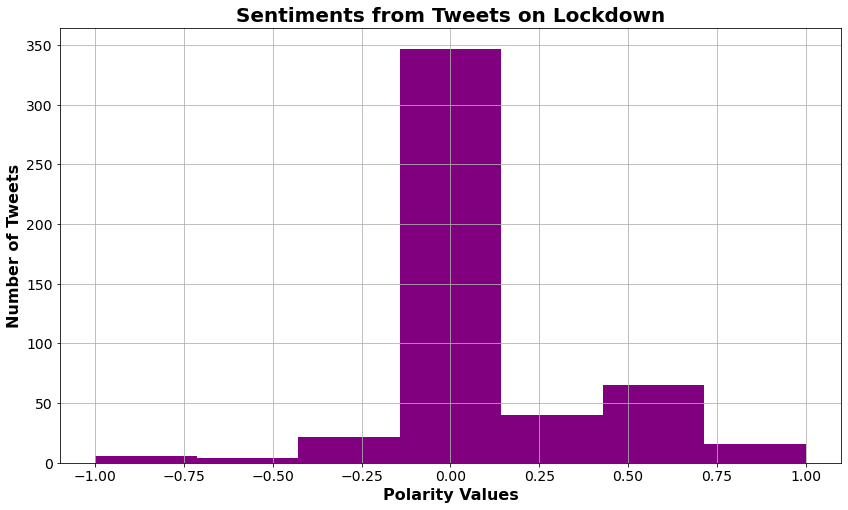

In [25]:
fig, ax = plt.subplots(figsize=(14,8))
df['Polarity'].hist(bins=7,
             ax=ax,
             color="purple", figsize = (14,8))

plt.title("Sentiments from Tweets on Lockdown", fontweight = 'bold', fontsize = 20)
plt.xlabel("Polarity Values", fontweight = 'bold', fontsize = 16)
ax.xaxis.set_tick_params(labelsize=14)
ax.yaxis.set_tick_params(labelsize=14)
plt.ylabel("Number of Tweets", fontweight = 'bold', fontsize = 16)
plt.show()

#### The above histogram shows the polarity of the tweets as positive, negative and neutral.  The polarity values of the tweets change with respect to the time as the tweets are analysed. 

In [26]:
df['Sentiment'].value_counts().iplot(kind ='bar', xTitle ='Sentiment', yTitle ='Count', title ='Overall Sentiment Distribution')

#### The above bar graph shows the total number of positive tweets, neutral tweets and negative tweets related to the topic 'Lockdown'.  Each bar represents the total number of tweets for the respective sentiment score.  As the cursor is hovered across each bar, the total number of tweets corresponding to that sentiment score is displayed.

In [27]:
df['Sentiment'].value_counts()

Neutral     254
Positive    189
Negative     57
Name: Sentiment, dtype: int64

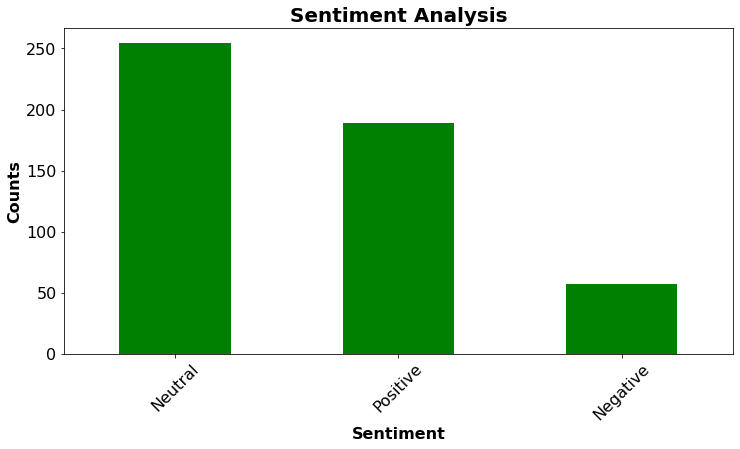

In [28]:
plt.title("Sentiment Analysis", fontweight = 'bold', fontsize = 20)
plt.xlabel("Sentiment", fontweight = 'bold', fontsize = 16)
plt.ylabel("Counts", fontweight = 'bold', fontsize = 16)
df['Sentiment'].value_counts().plot(kind="bar", rot = 45, fontsize = 16, color = 'g', figsize = (12,6))
plt.show()

#### The tweets analyzed regarding the topic 'LockDown' are live streaming tweets and latest tweets. There are more Neutral and Positive tweets regarding Lockdown and these neutral tweets show how conversations on twitter are shifting people to resume their normal life after lockdown.  People are looking forward to resume activities like travel and going out and talking about politics, entertainment, sports.